## Style embedding

We use the style embedding method proposed by [Gatys et al.](https://arxiv.org/abs/1508.06576) to transfer the style of a painting to a photograph. The method is based on the idea that the style of a painting can be represented by the correlations between the different filter responses of a CNN which are called the Gram matrices. The style of a painting is then transferred to a photograph by matching the correlations between the filter responses of the photograph and the painting.

For this we have modified the VGG19 network to capture the gram matrices from 5 layers of the network. The layers are `relu1_1`, `relu2_1`, `relu3_1`, `relu4_1` and `relu5_1`. 

### UMAP



The gram matrices, which contain many features for every layer, are embedded to a 2D space using UMAP. This results in 5 vectors of length 2 for every painting. The vectors are then concatenated to a single vector of length 10.   

In [98]:
from PIL import Image
from pathlib import Path
import cv2

import matplotlib.pyplot as plt
from matplotlib.offsetbox import (AnnotationBbox, OffsetImage)
import numpy as np

from sklearn.neighbors import KDTree

In [97]:
def draw_umap_with_labels(umap_embeddings, labels, title=''):
    plt.figure(figsize=(8, 8))
    plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], c=labels, s=7, cmap='Spectral',)
    plt.title(title, fontsize=14)
    plt.savefig(title + '.png')
    plt.show()

def draw_with_pictures(umap_embeddings, labels, pictures, title=''):
    fig, ax = plt.subplots(figsize=(8, 8))
    
    plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], c=labels, s=10, cmap='Spectral')
    for position, filename in zip(umap_embeddings, pictures):
        im = plt.imread(filename, format="jpg")
        im_transparent = np.dstack((im, 192 * np.ones((im.shape[0], im.shape[1], 1), dtype=np.uint8)))
        resized_image = cv2.resize(im_transparent, (100, 100), interpolation = cv2.INTER_CUBIC)

        imagebox = OffsetImage(resized_image, zoom=0.75)
        imagebox.image.axes = ax
        sb = AnnotationBbox(imagebox, (position[0], position[1]), bboxprops=dict(boxstyle="sawtooth", alpha=0.5))
        ax.add_artist(sb)

    ax.set_xlim(min(umap_embeddings[:,0])*0.8, max(umap_embeddings[:,0])*1.2)
    ax.set_ylim(min(umap_embeddings[:,1])*0.8, max(umap_embeddings[:,1])*1.2)
    plt.title(title, fontsize=14)
    plt.show()

def plot_images(images, labels, nrows, ncols, step=1):
    """Plot nrows x ncols images from images and set labels as titles."""
    figsize = [8, 8]
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        idx = i * step
        if images[i].shape[-1] == 1:
            ax.imshow(images[i].reshape(images[idx].shape[0], images[idx].shape[1]))
        else:
            ax.imshow(images[idx])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(labels[idx])
    plt.tight_layout()
    plt.show()

First we look at 400 samples from 4 different classes: Abstract, Animal Painting, Citiscape and Mythological Painting. The classes clearly overlap each other. Note that for the algorithm the information about the classes (or any other metadata) is not used!

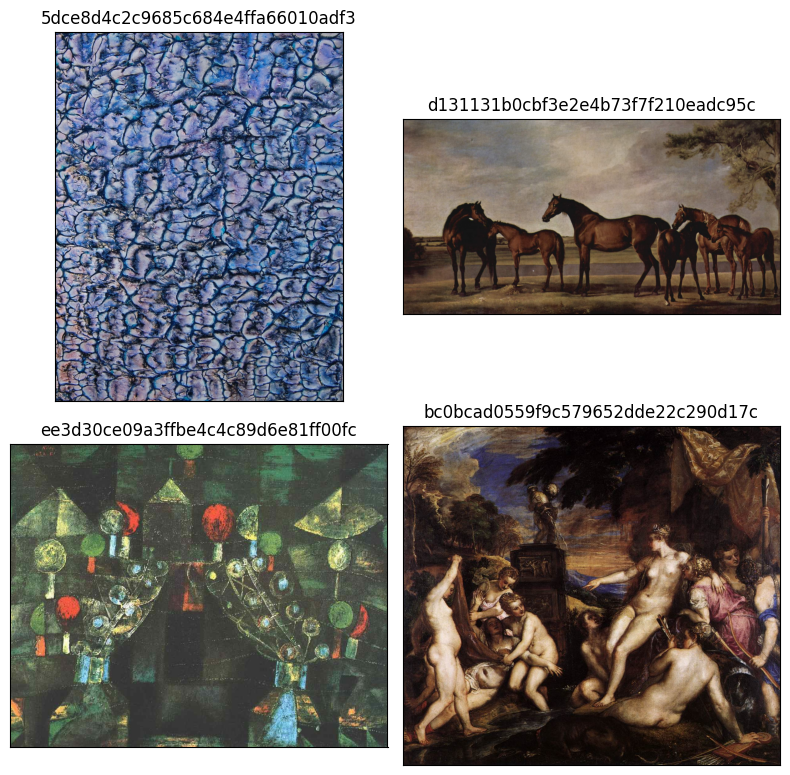

In [99]:
def read_n_lines(filepath, n):
    with open(filepath, 'r') as file:
        return [line.strip() for line in file.readlines()[:n]]

image_filepaths = [ Path(filepath) for txt_with_image_filepaths in ["style_images_abstract.txt", "style_images_animal-painting.txt", "style_images_cityscape.txt", "style_images_mythological-painting.txt"] for filepath in read_n_lines(txt_with_image_filepaths, 100) ]
image_hashes = [filepath.stem for filepath in image_filepaths]
images = [np.array(Image.open(filepath)) for filepath in image_filepaths]

labels = [0] * 100 + [1] * 100 + [2] * 100 + [3] * 100
categories = ["Abstract"] * 100 + ["Animal"] * 100 + ["City Scapes"] * 100 + ["Mythological"] * 100

plot_images(images, image_hashes, 2, 2, step=100)


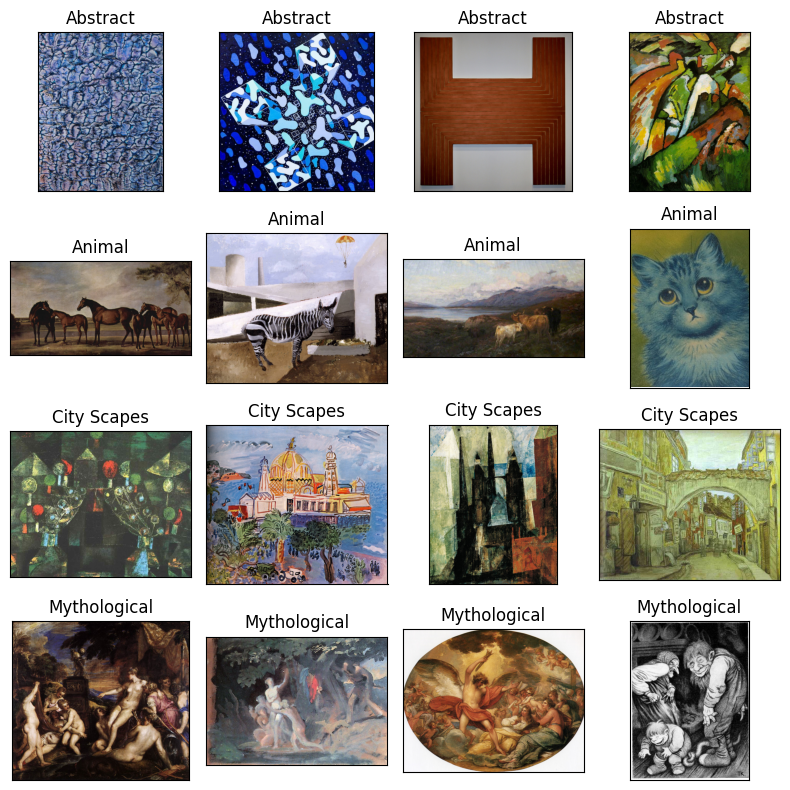

In [57]:
plot_images(images, categories, 4, 4, step=25)

The UMAP embedding of the gram matrices of the 400 samples from 4 different classes. It is worth noting the deeper the layer the less granulated the embedding is. This is because the deeper the layer the more abstract the features are. This results in classes being more separated in the deeper layer encodings.

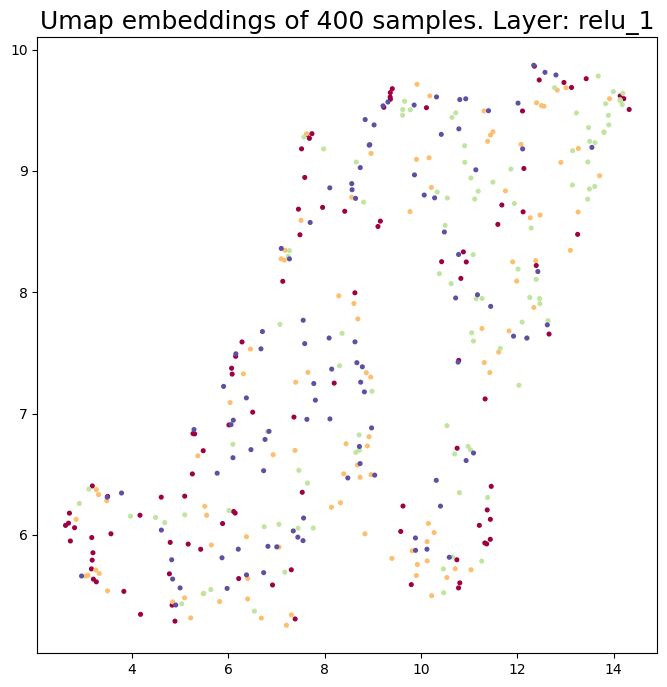

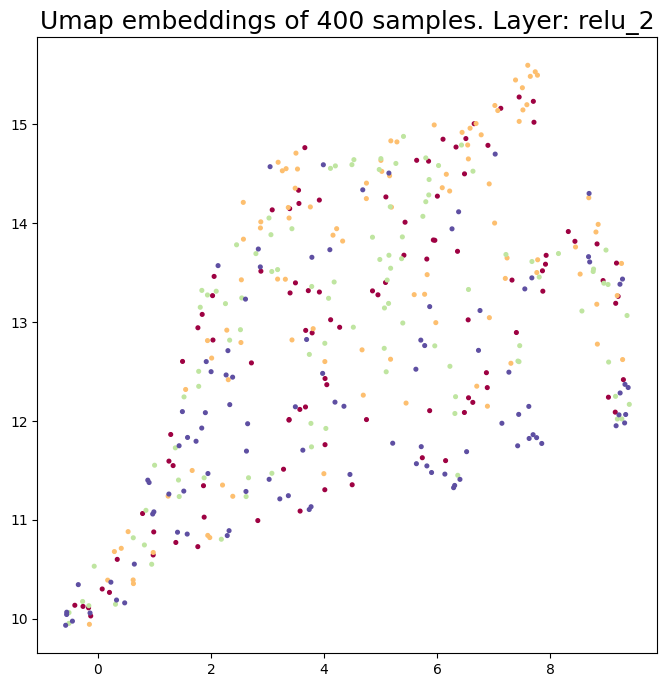

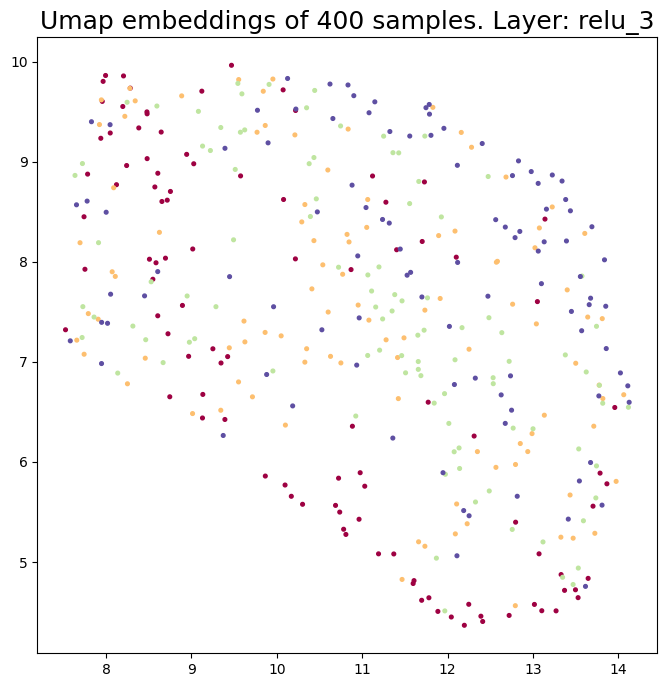

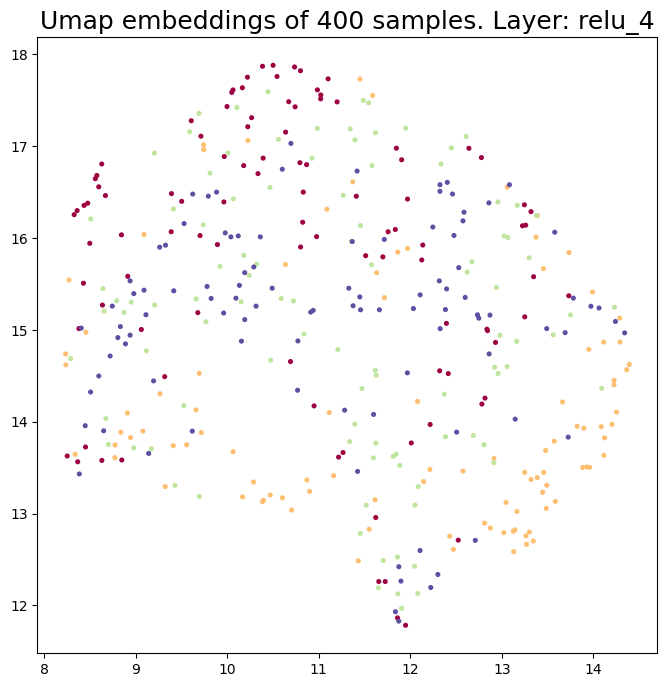

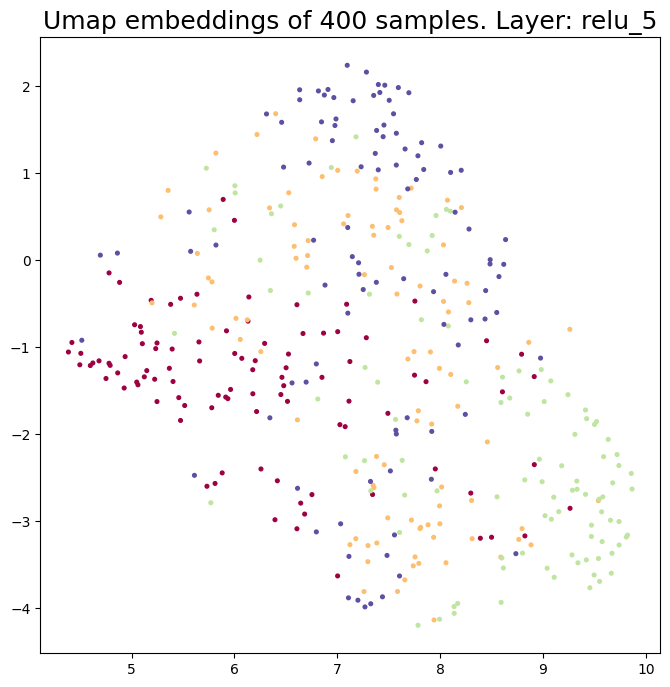

In [96]:
umap_embeddings = [np.load(filepath) for filepath in ["relu_1_umap.npy", "relu_2_umap.npy", "relu_3_umap.npy", "relu_4_umap.npy", "relu_5_umap.npy"]]
for i, umap_embedding in enumerate(umap_embeddings):
    draw_umap_with_labels(umap_embedding, labels, title=f'Umap embeddings of 400 samples. Layer: relu_{str(i + 1)}')


For a better understanding of the embedding we look at the aforementioned 16 samples from 4 classes. We can see that i.e. for layer relu3_1 the colorful depiction of a city is close to more vibrant of the abstract painting. The viewer can decide if the following layers are able to capture the style of the painting. 

(400, 2)
(16, 2)


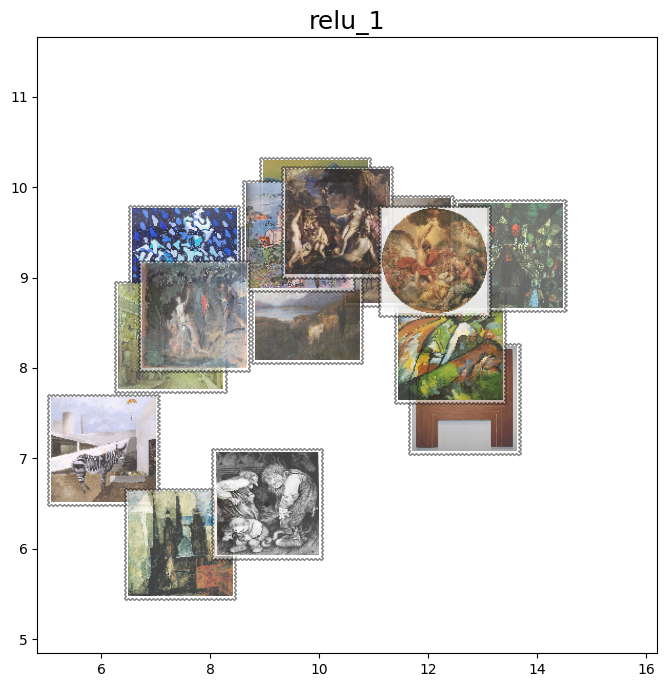

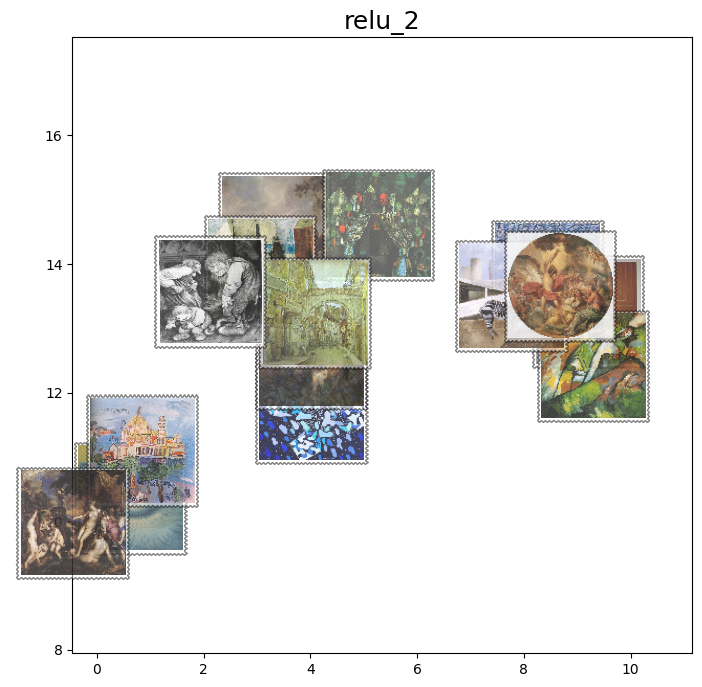

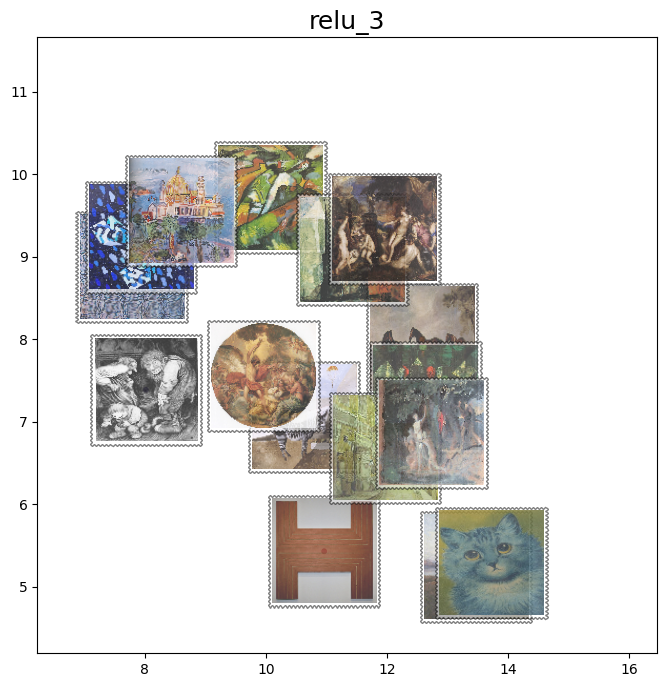

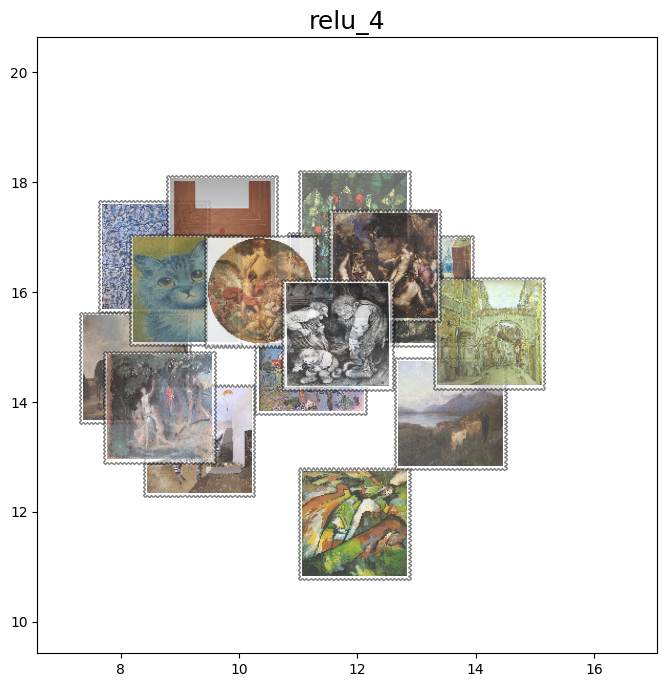

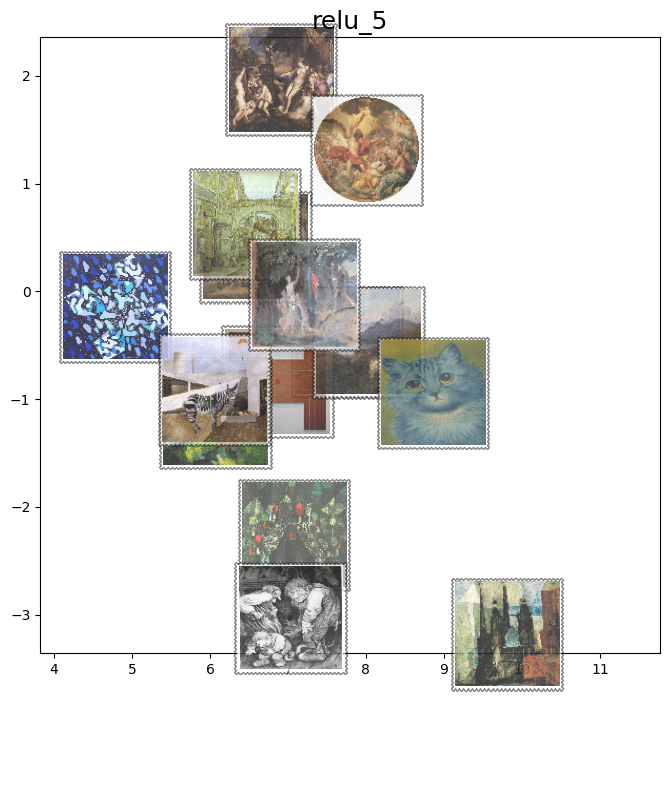

In [83]:
sample_image_paths = [image_path for image_path in image_filepaths[::25]]
sample_labels = [label for label in labels[::25]]

sample_umap_embeddings = [umap_embedding[::25, :] for umap_embedding in umap_embeddings]

for i, umap_embedding in enumerate(sample_umap_embeddings):
    draw_with_pictures(umap_embedding, sample_labels, sample_image_paths, title='Sample embeddings for relu_' + str(i + 1))

### Finding similar paintings with KDTree

We concatenate the 5 vectors of length 2 to a single vector of length 10. This vector is then used for a KDTree search. The KDTree search is used to find the 5 most similar paintings. The results are shown below.

In [100]:
concatenated_umap_embeddings = np.concatenate(umap_embeddings, axis=1)
tree = KDTree(concatenated_umap_embeddings)
distances, indices = tree.query(concatenated_umap_embeddings, k=5)

print(indices)


[[  0  17 190   5 133]
 [  1 179 202 200 285]
 [  2  18  13  58  38]
 ...
 [397 131 237  25  29]
 [398 251 111 346 189]
 [399 329 372 117  59]]


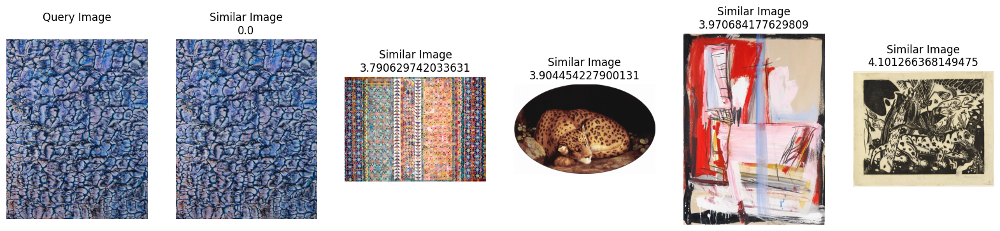

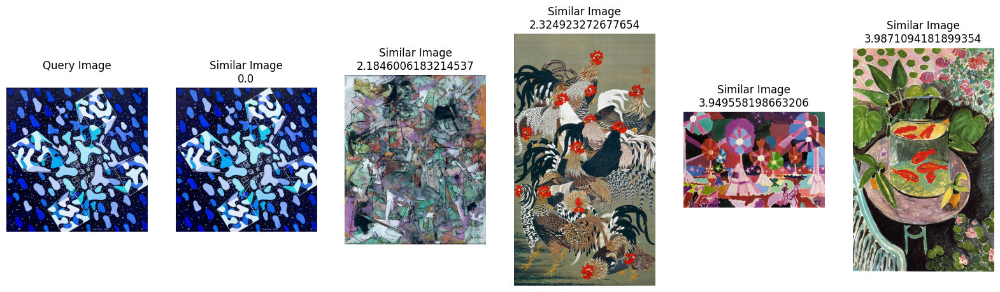

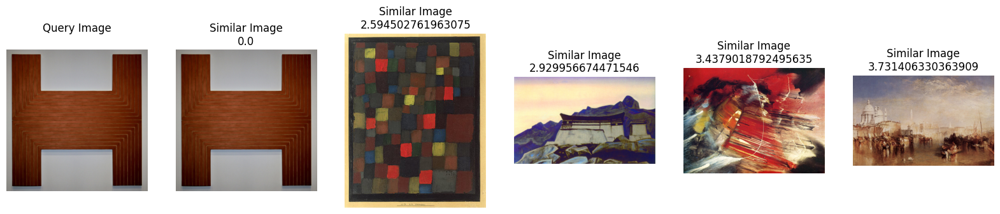

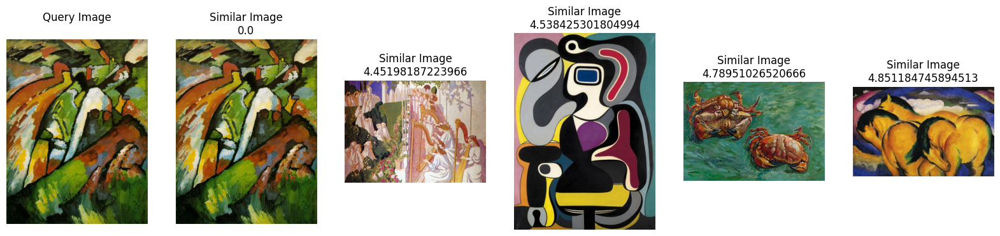

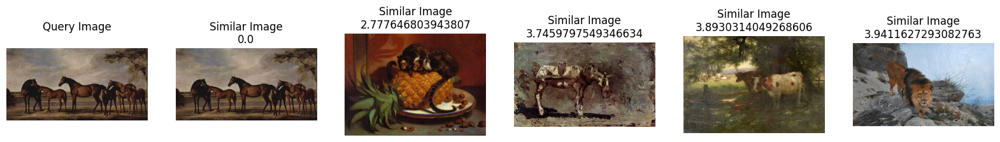

...

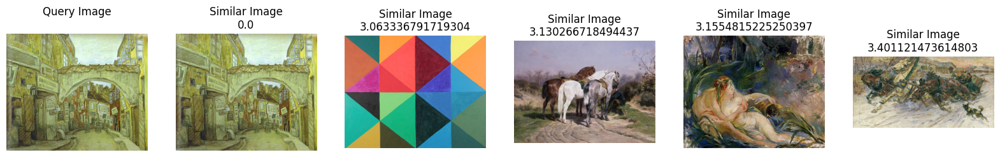

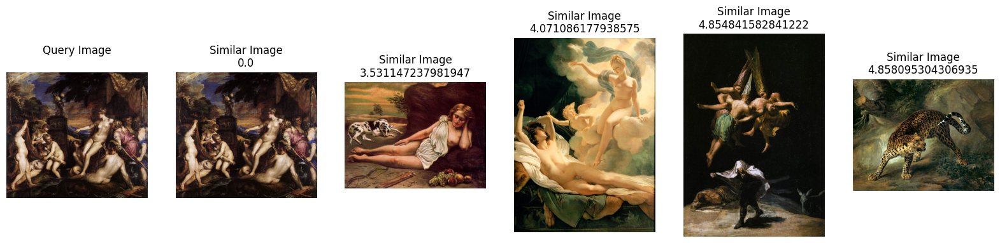

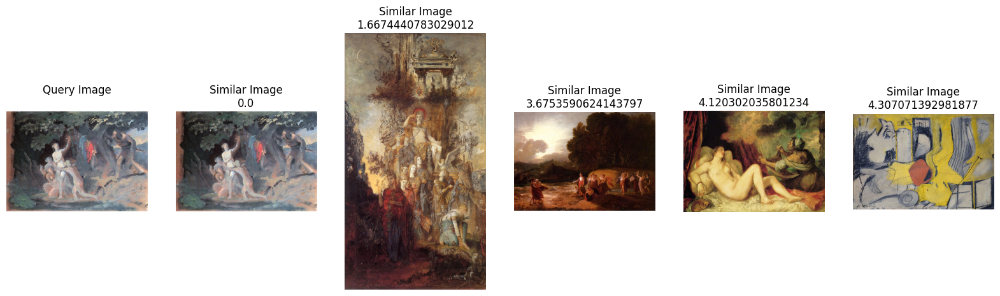

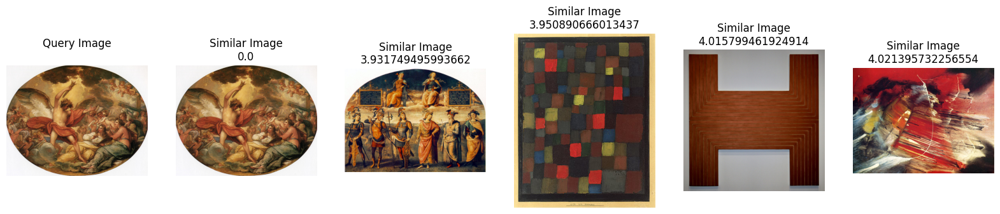

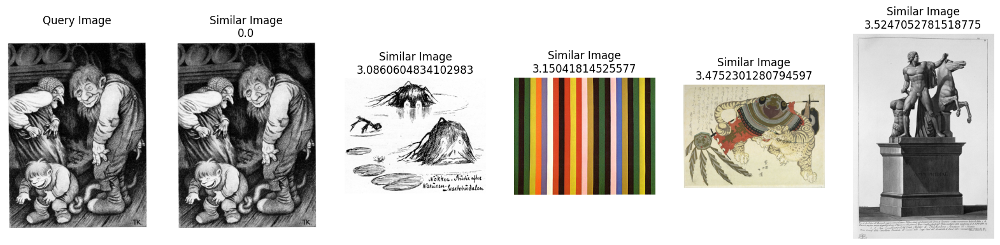

In [101]:
def plot_similar_images(query_image, distances, indices):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 6, 1)
    plt.imshow(query_image)
    plt.title("Query Image\n")
    plt.axis('off');

    for i in range(5):
        plt.subplot(1, 6, i+2)
        plt.imshow(images[indices[i]])
        plt.title("Similar Image\n" + str(distances[i]))
        plt.axis('off');

    plt.show()

for i in range(0, 400, 25):
    plot_similar_images(images[i], distances[i], indices[i])

### Conclusion

The proposed system seems good enough for the purpose of this project. The created pipeline is able to find similar paintings in a abstract way with only the data from the image itself. We will enhance it with more information from the color features in the next section.